In [1]:
import os
import glob
from itertools import product

import numpy as np
import cv2 as cv

from hep2_classification import preprocess
from hep2_classification.presentation import display_grid, ImagePlotter, HistogramPlotter

## Settings

In [2]:
paths = list(sorted(glob.glob('data/samples/*.*')))
titles = [os.path.splitext(os.path.basename(p))[0] for p in paths]

## Load and preprocess data

In [3]:
imgs = [cv.imread(p) for p in paths]
imgs_pre = [preprocess(img) for img in imgs]

## Kernels comparison

In [4]:
k_sizes = [7,9,11,13]
k_types = [cv.MORPH_ELLIPSE]
k_deltas = [-400, -800, -1200, -1600, -2000]
k_names = ['circle']

/home/regzand/Documents/Repositories/AGH-HEp2CellClassification/hep2_classification/presentation.py:63: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f, axes = plt.subplots(rows, cols, figsize=(width, height), squeeze=False, **kwargs)


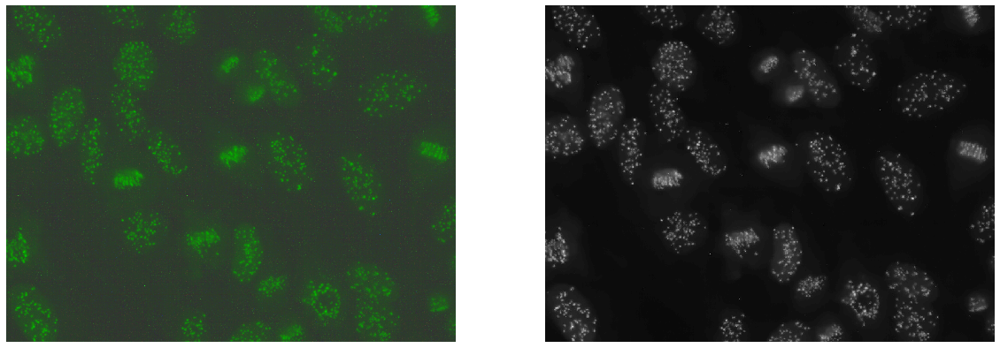

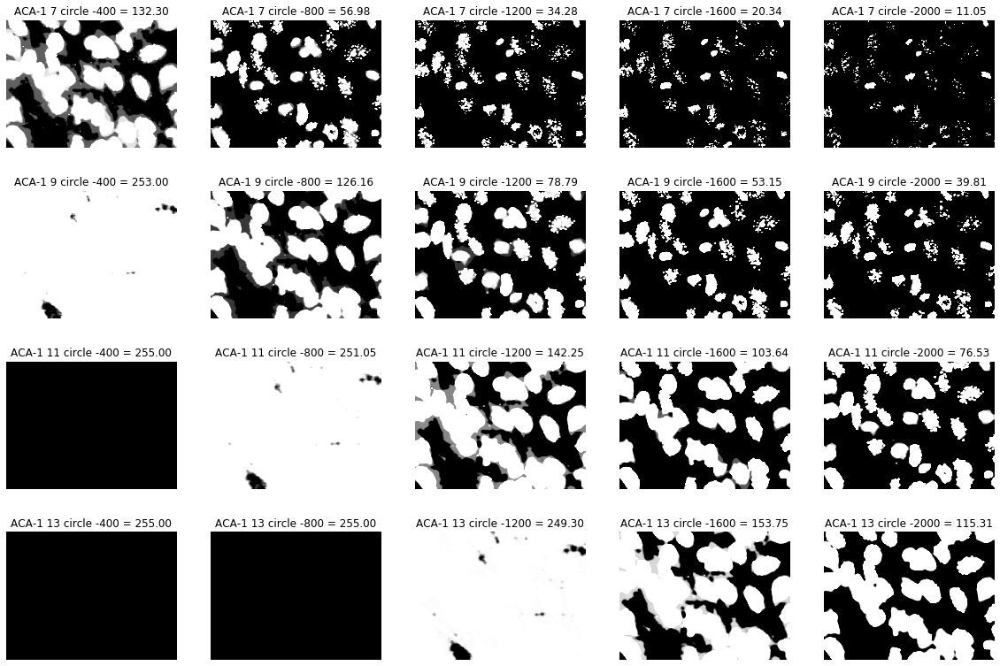

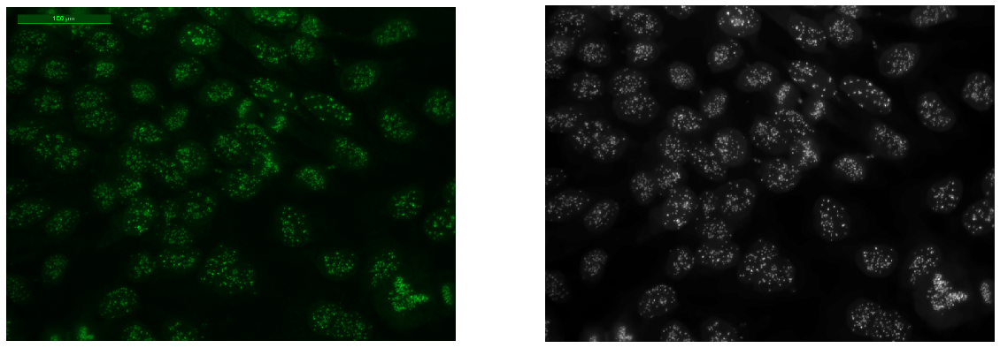

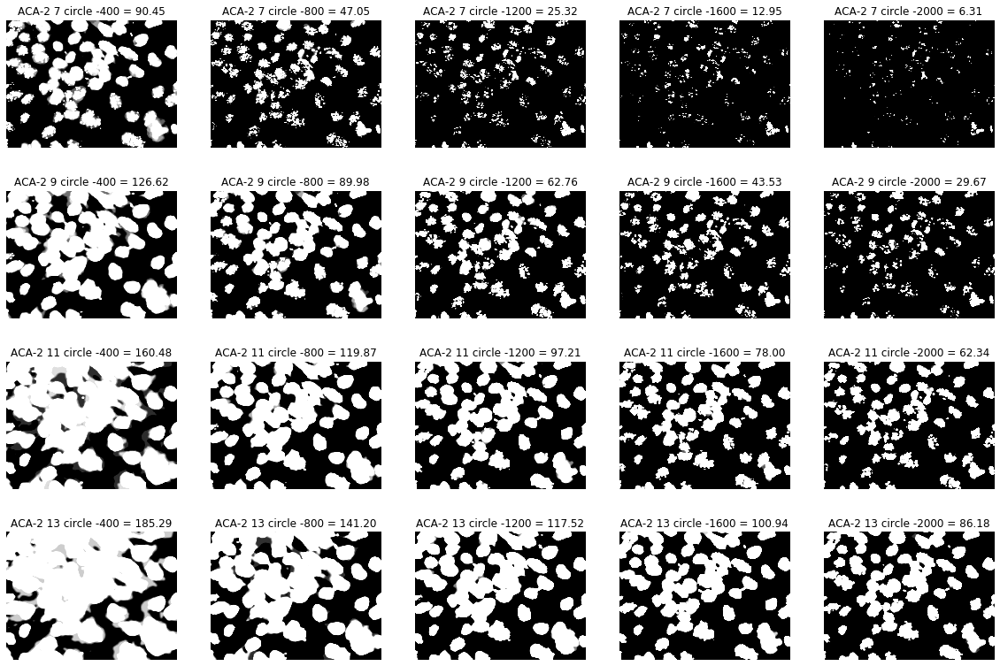

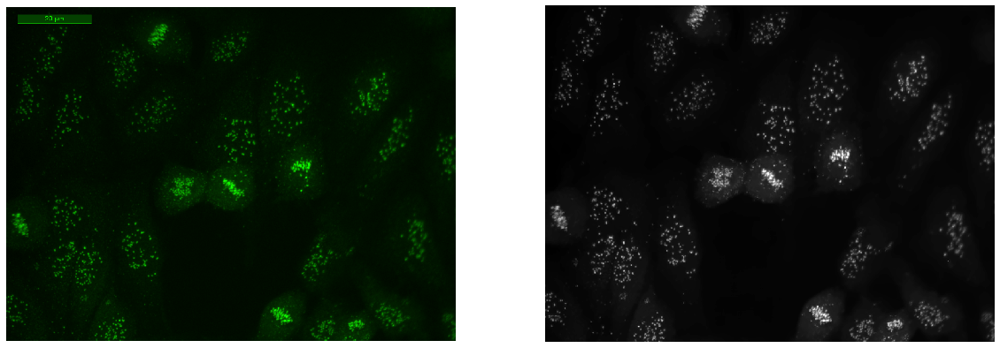

...

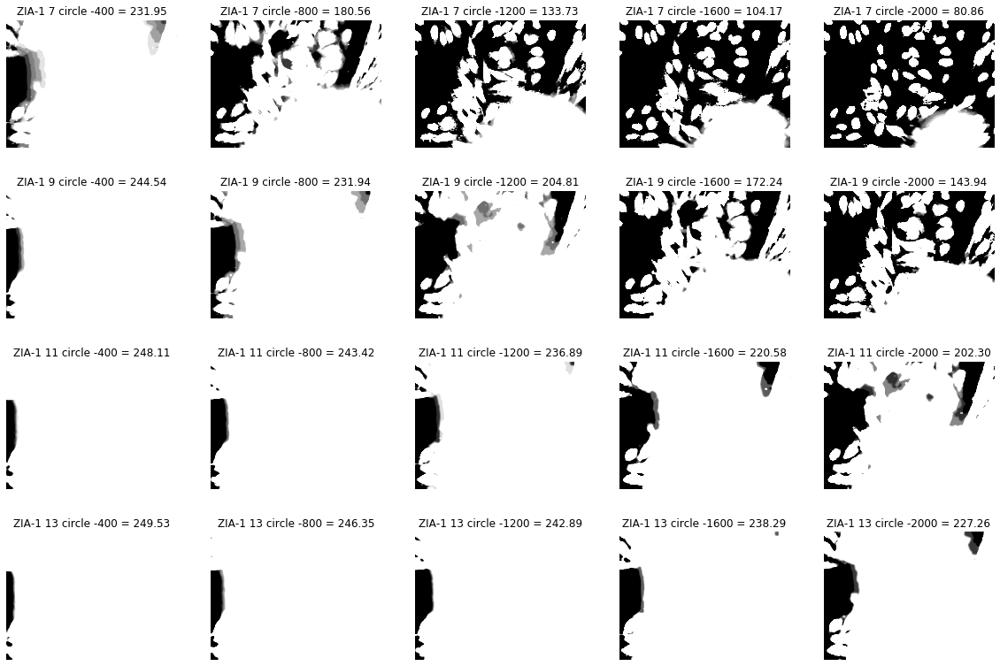

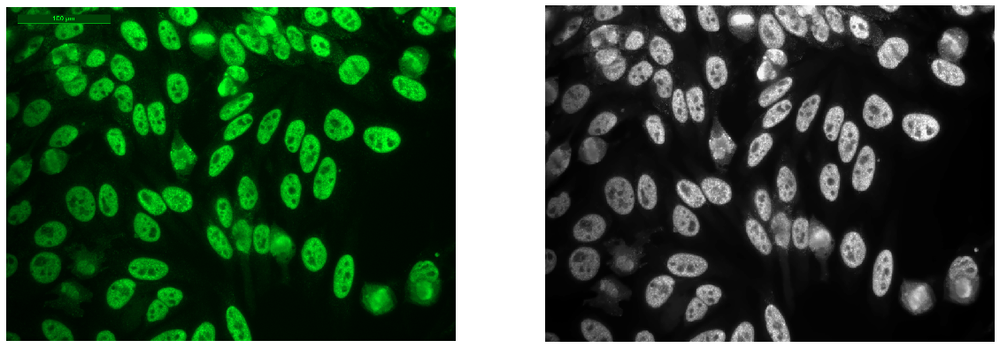

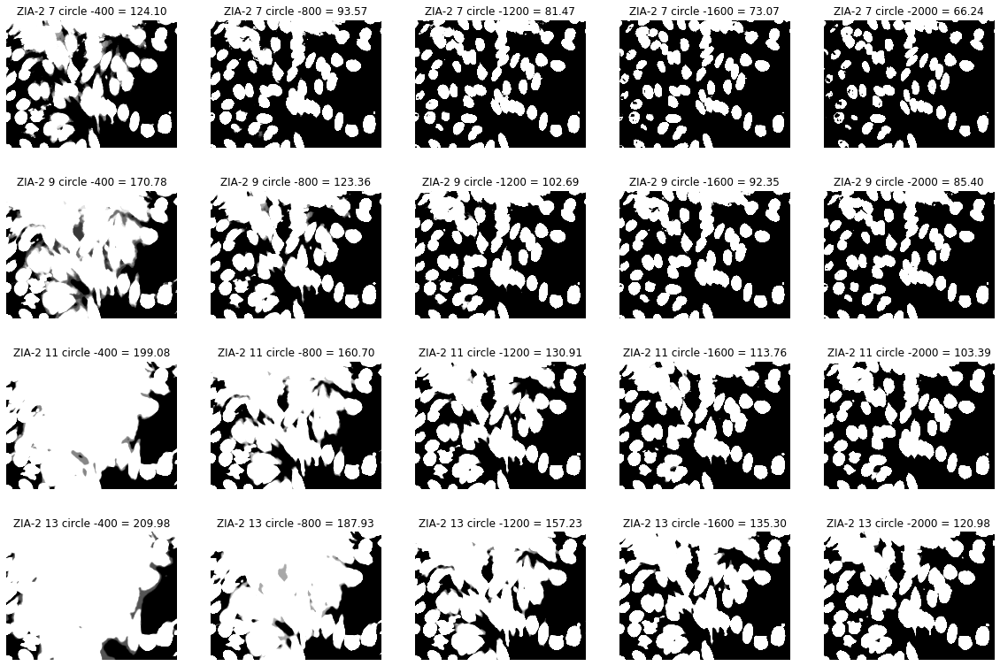

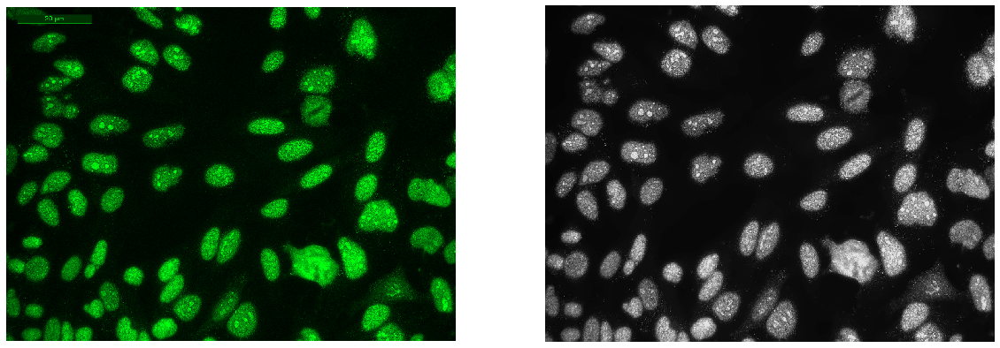

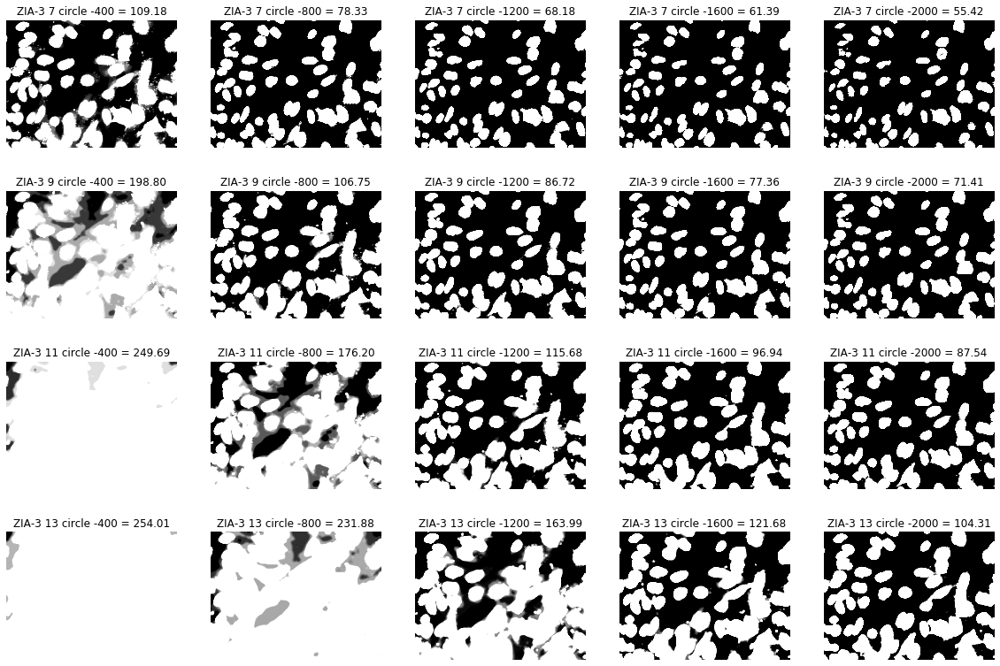

In [5]:
for img, img_pre, title in zip(imgs, imgs_pre, titles):
    results = [
        cv.filter2D(img_pre, -1, cv.getStructuringElement(k_type, (k_size,k_size)), delta=k_delta)
        for k_size, k_delta, k_type in product(k_sizes, k_deltas, k_types)
    ]

    results_names = [
        f'{title} {k_size} {k_type} {k_delta}'
        for k_size, k_delta, k_type in product(k_sizes, k_deltas, k_names)
    ]
    
    averages = [
        np.average(res)
        for res in results
    ]
    
    names = [
        f'{name} = {avg:.2f}'
        for name, avg in zip(results_names, averages)
    ]
    
    display_grid([img, img_pre], ImagePlotter(show_axis=False), cols=2)
    display_grid(results, ImagePlotter(show_axis=False), names, cols=5)